In [260]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

# Boston

In [271]:
boston_listings = pd.read_csv("boston_listings_utf8.csv")
boston_listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12147973,https://www.airbnb.com/rooms/12147973,2.016090e+13,2016/9/7,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",...,NaN,f,NaN,NaN,f,moderate,f,f,1,NaN
1,3075044,https://www.airbnb.com/rooms/3075044,2.016090e+13,2016/9/7,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...",...,9.0,f,NaN,NaN,t,moderate,f,f,1,1.30
2,6976,https://www.airbnb.com/rooms/6976,2.016090e+13,2016/9/7,Mexican Folk Art Haven in Boston,"Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...","Come stay with a friendly, middle-aged guy in ...",none,The LOCATION: Roslindale is a safe and diverse...,...,10.0,f,NaN,NaN,f,moderate,t,f,1,0.47
3,1436513,https://www.airbnb.com/rooms/1436513,2.016090e+13,2016/9/7,Spacious Sunny Bedroom Suite in Historic Home,Come experience the comforts of home away from...,Most places you find in Boston are small howev...,Come experience the comforts of home away from...,none,Roslindale is a lovely little neighborhood loc...,...,10.0,f,NaN,NaN,f,moderate,f,f,1,1.00
4,7651065,https://www.airbnb.com/rooms/7651065,2.016090e+13,2016/9/7,Come Home to Boston,"My comfy, clean and relaxing home is one block...","Clean, attractive, private room, one block fro...","My comfy, clean and relaxing home is one block...",none,"I love the proximity to downtown, the neighbor...",...,10.0,f,NaN,NaN,f,flexible,f,f,1,2.25


<h1> Data Cleaning </h1>

In [3]:
boston_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3585 entries, 0 to 3584
Data columns (total 95 columns):
id                                  3585 non-null int64
listing_url                         3585 non-null object
scrape_id                           3585 non-null int64
last_scraped                        3585 non-null object
name                                3585 non-null object
summary                             3442 non-null object
space                               2528 non-null object
description                         3585 non-null object
experiences_offered                 3585 non-null object
neighborhood_overview               2170 non-null object
notes                               1610 non-null object
transit                             2295 non-null object
access                              2096 non-null object
interaction                         2031 non-null object
house_rules                         2393 non-null object
thumbnail_url                       2986

In [4]:
boston_listings.isnull().sum()

id                                    0
listing_url                           0
scrape_id                             0
last_scraped                          0
name                                  0
                                   ... 
cancellation_policy                   0
require_guest_profile_picture         0
require_guest_phone_verification      0
calculated_host_listings_count        0
reviews_per_month                   756
Length: 95, dtype: int64

In [7]:
boston_listings.duplicated().value_counts()

False    3585
dtype: int64

In [9]:
df_boston_listings = boston_listings.loc[:, ["id", "host_id", "latitude", "longitude", "price", "minimum_nights", "number_of_reviews", "reviews_per_month", "calculated_host_listings_count", "availability_365"]]

In [10]:
df_boston_listings.describe()

,id,host_id,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.585000e+03,3.585000e+03,3585.000000,3585.000000,3585.000000,3585.000000,2829.000000,3585.000000,3585.000000
mean,8.440875e+06,2.492311e+07,42.340032,-71.084818,3.171269,19.044630,1.970908,12.733891,179.346444
std,4.500787e+06,2.292781e+07,0.024403,0.031565,8.874133,35.571658,2.120561,29.415076,142.136180
min,3.353000e+03,4.240000e+03,42.235942,-71.171789,1.000000,0.000000,0.010000,1.000000,0.000000
25%,4.679319e+06,6.103425e+06,42.329995,-71.105083,1.000000,1.000000,0.480000,1.000000,19.000000
50%,8.577620e+06,1.928100e+07,42.345201,-71.078429,2.000000,5.000000,1.170000,2.000000,179.000000
75%,1.278953e+07,3.622147e+07,42.354685,-71.062155,3.000000,21.000000,2.720000,6.000000,325.000000
max,1.493346e+07,9.385411e+07,42.389982,-71.000100,300.000000,404.000000,19.150000,136.000000,365.000000


## Cleaning the Neighbourhood column

In [11]:
boston_listings['neighbourhood']=boston_listings['neighbourhood'].str.split('/').str[0].str.strip()

# Exploration Analysis

### geographical distribution

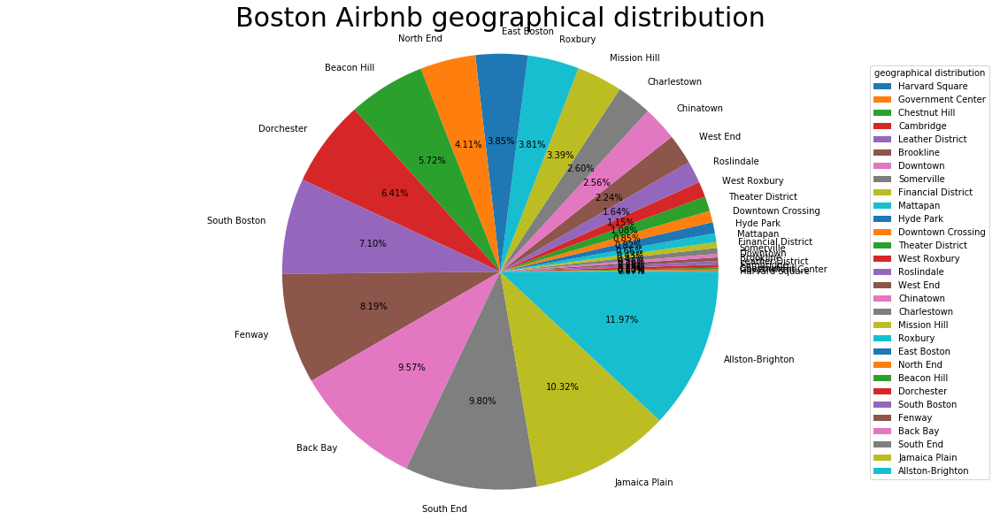

In [17]:
boston_data_area=boston_listings['neighbourhood'].value_counts(ascending=True)
plt.figure(figsize=(20,10))
plt.pie(boston_data_area, labels=boston_data_area.index, autopct='%.2f%%',shadow=False)  
plt.title("Boston Airbnb geographical distribution",fontsize=30)
plt.axis('equal') 
plt.legend(title = "geographical distribution", loc = "center right") 

### type distribution

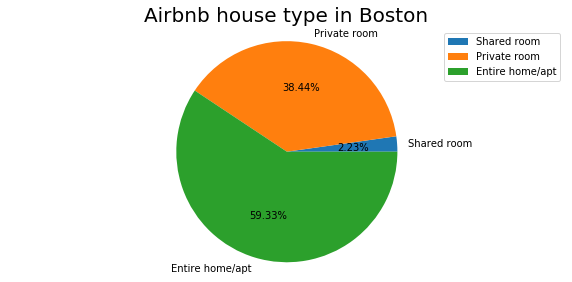

In [230]:
plt.figure(figsize=(10,10))

# Pie
Boston_type= boston_listings['room_type'].value_counts(ascending=True)
plt.subplot(211)
plt.pie(Boston_type, labels=Boston_type.index, autopct='%.2f%%',shadow=False)  
plt.title("Airbnb house type in Boston",fontsize=20)
plt.axis('equal')
plt.legend() 

room_type,Entire home/apt,Private room,Shared room
neighbourhood,,,
Back Bay,251.0,39.0,1.0
South End,231.0,61.0,6.0
Fenway/Kenmore,187.0,56.0,6.0
South Boston,148.0,65.0,3.0
Jamaica Plain,145.0,167.0,2.0
Allston-Brighton,143.0,209.0,12.0
Beacon Hill,142.0,31.0,1.0
North End,106.0,17.0,2.0
Chinatown,73.0,5.0,NaN


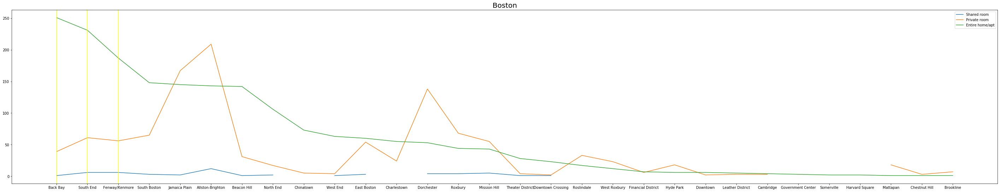

In [234]:
# line chart
plt.figure(figsize=(50,20))
Boston_area_type = boston_listings.groupby(['neighbourhood','room_type']).size().unstack()
Boston_area_type = Boston_area_type.sort_values(by='Entire home/apt',ascending=False) # sort with the value from the biggest
x= Boston_area_type.index
plt.subplot(212)
plt.title("Boston",fontsize=20)
plt.plot(x,Boston_area_type['Shared room'],label = 'Shared room') 
plt.plot(x,Boston_area_type['Private room'],label = 'Private room') 
plt.plot(x,Boston_area_type['Entire home/apt'],label = 'Entire home/apt') 
plt.legend()  

# draw a verticle line to find certain data, Allston-Brighton, Back Bay, Beacon Hill
ax = plt.gca()
ax.axvline("South End", color = "yellow")
ax.axvline("Back Bay", color = "yellow")
ax.axvline("Fenway/Kenmore", color = "yellow")

Boston_area_type



### Price distribution

Text(0, 0.5, 'score')

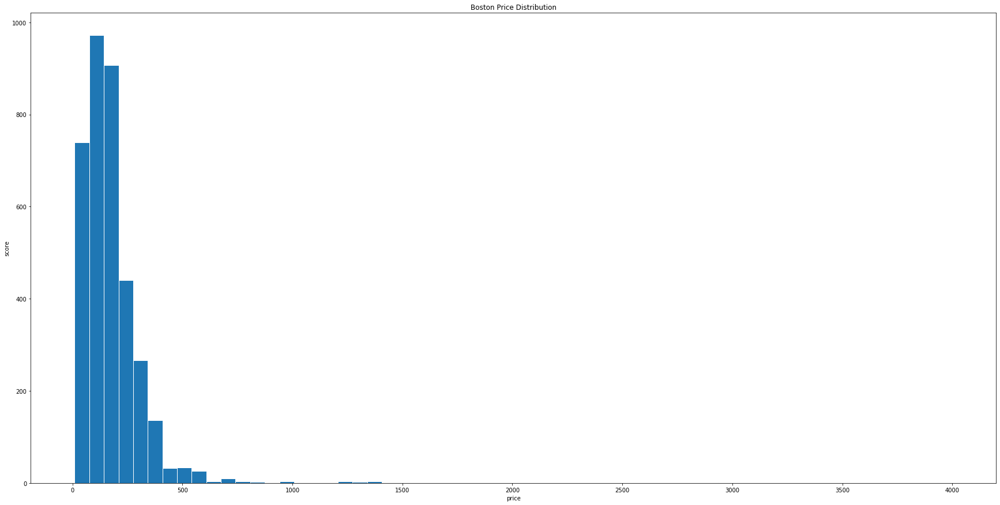

In [255]:
#Histogram
plt.figure(figsize=(30,15))
plt.hist(boston_listings["price"], bins = 60 ,edgecolor='white',alpha=1)  
plt.title("Boston Price Distribution")
plt.xlabel('price')
plt.ylabel('score')

# ? What's the x-axis

In [256]:
area_price_boston = boston_listings.groupby("neighbourhood",as_index=True).agg({'price':["mean","sum"]})
area_price_boston.columns = area_price_boston.columns.droplevel(0)
price_sort_boston=area_price_boston.sort_values(by=['sum'],ascending = False)
price_sort_boston_mean=area_price_boston.sort_values(by=['mean'],ascending = False)
price_sort_boston_mean

,mean,sum
neighbourhood,,
Harvard Square,359.000000,718
Financial District,283.692308,3688
Downtown Crossing,273.500000,7111
Leather District,245.875000,1967
Back Bay,245.457045,71428
Chinatown,235.410256,18362
Theater District,234.151515,7727
South Boston,232.120370,50138
Fenway/Kenmore,230.104418,57296


Text(0.5, 1.0, 'Average price by region')

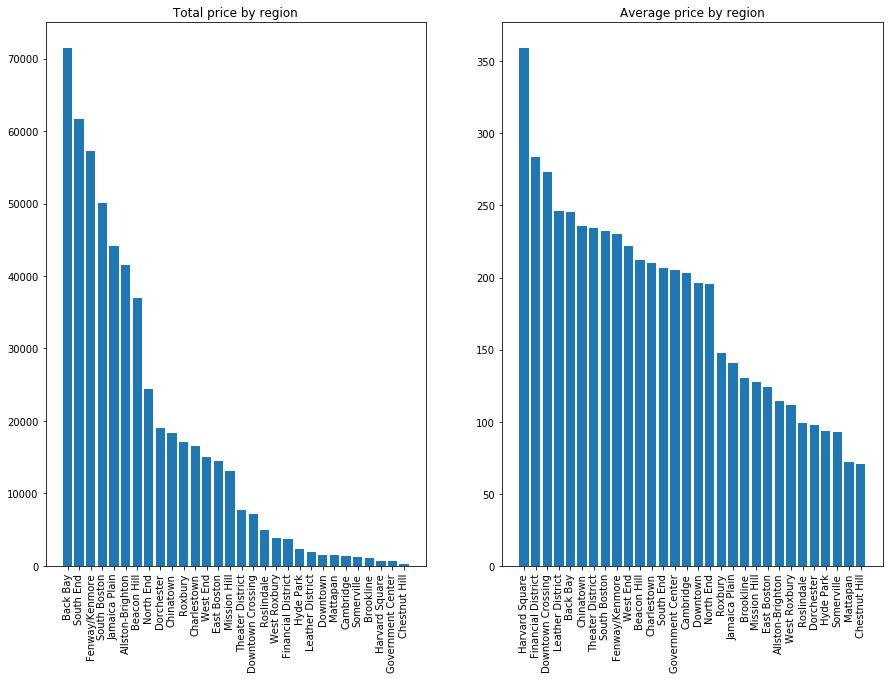

In [246]:
# Price in each area
plt.figure(figsize=(15,10))

# Total price by region
plt.subplot(121)
plt.bar(price_sort_boston.index,price_sort_boston['sum'])
plt.xticks(rotation=90)
plt.title('Total price by region')
# Average price by region
plt.subplot(122)
plt.bar(price_sort_boston_mean.index,price_sort_boston_mean['mean'])
plt.xticks(rotation=90)
plt.title('Average price by region')

### Host distribution

In [273]:
Boston_room_num=boston_listings.groupby('host_id',as_index=False)['id'].count().sort_values(by='id',ascending=False)
Boston_room_num.rename(columns={"id": "room_num"},inplace=True)
Boston_room_num.head()

,host_id,room_num
1343,30283594,136
6,25188,79
646,9419684,61
765,12243051,58
1108,22348222,50


1.6437414030261348


(0, 100)

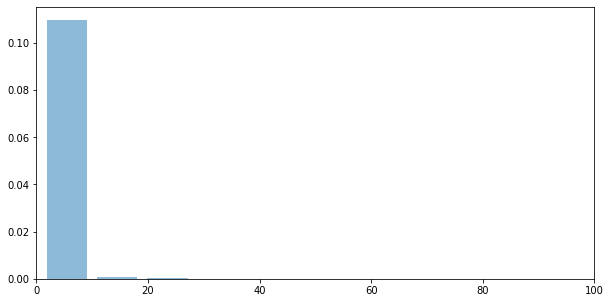

In [274]:
# average number of rooms
print(Boston_room_num['room_num'].mean())

plt.figure(figsize=(10,5))
plt.hist(Boston_room_num['room_num'],bins=15,density=1,alpha=0.5,rwidth=0.8)
plt.xlim(0,100)#X-axis

In [275]:
Boston_host_num=Boston_room_num.groupby('room_num',as_index=False)['host_id'].count()
Boston_host_num.rename(columns={"host_id": "host_num"},inplace=True)
Boston_host_num=Boston_host_num.sort_values(by='host_num',ascending=True)
Boston_host_num.head()

,room_num,host_num
12,13,1
22,61,1
21,58,1
20,50,1
19,25,1


In [276]:
Boston_host_num['room_num_all']=Boston_host_num['room_num']*Boston_host_num['host_num']
#The cumulative proportion of room
Boston_host_num["room_percentage"] = Boston_host_num["room_num_all"].cumsum()/Boston_host_num["room_num_all"].sum()*100
#The cumulative proportion of host
Boston_host_num["host_percentage"] = Boston_host_num["host_num"].cumsum()/Boston_host_num["host_num"].sum()*100
Boston_host_num.head()

,room_num,host_num,room_num_all,room_percentage,host_percentage
12,13,1,13,0.362622,0.045851
22,61,1,61,2.064156,0.091701
21,58,1,58,3.682008,0.137552
20,50,1,50,5.076709,0.183402
19,25,1,25,5.774059,0.229253


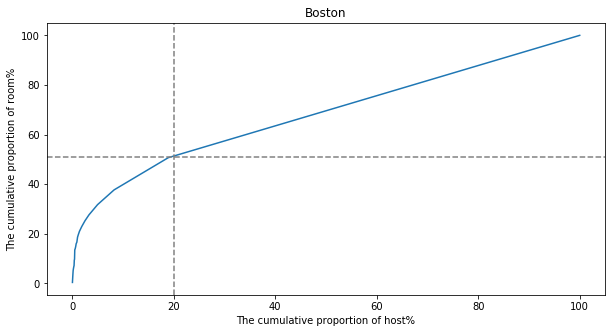

In [281]:
plt.figure(figsize=(10,5))
plt.plot(Boston_host_num.host_percentage, Boston_host_num.room_percentage)
# Gride & Guides
plt.axhline(y=51,color='grey',linestyle='dashed')
plt.axvline(x=20,color='grey',linestyle='dashed')
plt.xlabel("The cumulative proportion of host%")
plt.ylabel("The cumulative proportion of room%")
plt.title('Boston')
plt.show()

### Geo scatter

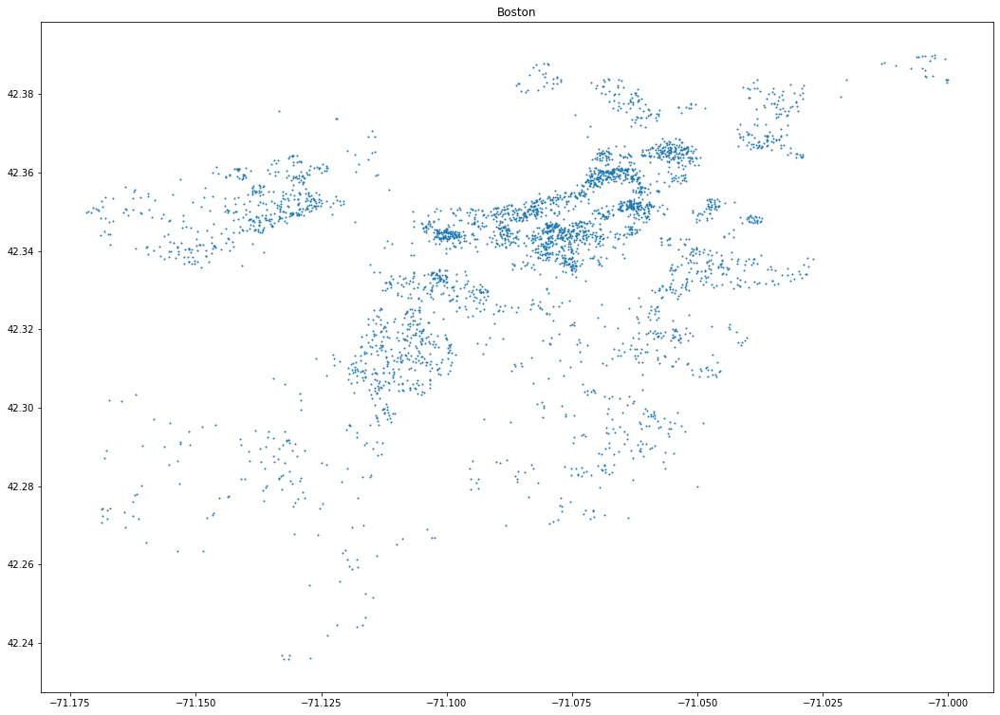

In [218]:
# The origional one
plt.figure(figsize=(18,13))
plt.title('Boston')
plt.scatter(boston_listings.longitude, boston_listings.latitude, s=1)

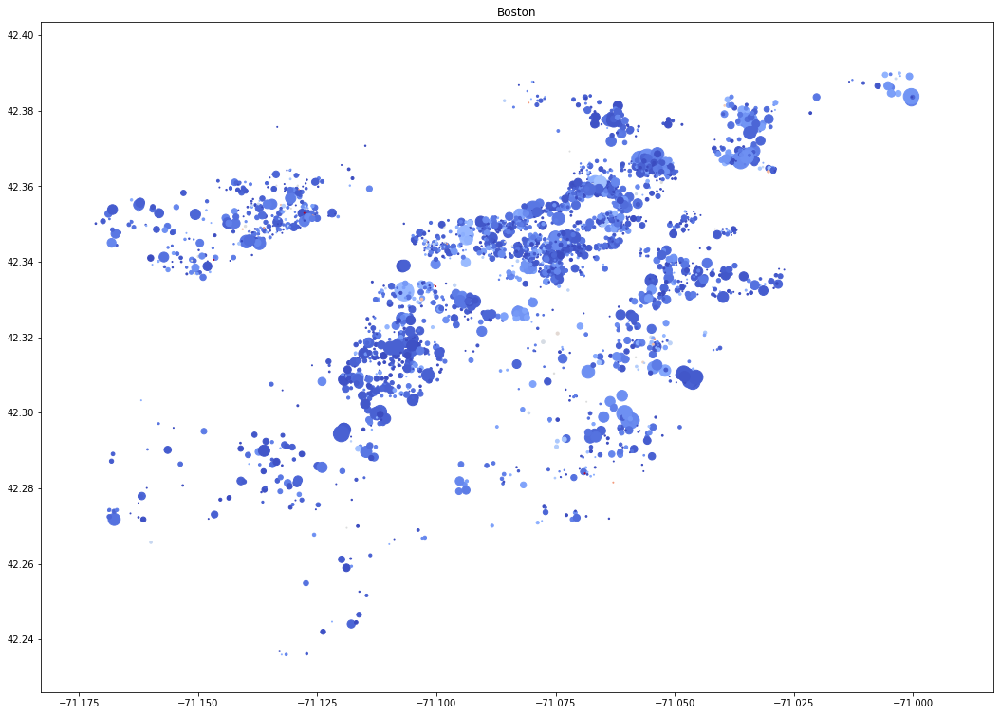

In [221]:
plt.figure(figsize=(18,13))
plt.title('Boston')
size = boston_listings.number_of_reviews
color = boston_listings.review_scores_rating/100
plt.scatter(boston_listings.longitude,  boston_listings.latitude, 
            s=size, c=255*color, cmap="coolwarm_r")

### Where do houses come from?

In [223]:
Boston_location_counts = boston_listings.groupby("neighbourhood").size().sort_values(ascending=False)
Boston_location_counts

neighbourhood
Allston-Brighton      364
Jamaica Plain         314
South End             298
Back Bay              291
Fenway/Kenmore        249
South Boston          216
Dorchester            195
Beacon Hill           174
North End             125
East Boston           117
Roxbury               116
Mission Hill          103
Charlestown            79
Chinatown              78
West End               68
Roslindale             50
West Roxbury           35
Theater District       33
Downtown Crossing      26
Hyde Park              25
Mattapan               20
Financial District     13
Somerville             13
Downtown                8
Leather District        8
Brookline               8
Cambridge               7
Chestnut Hill           4
Government Center       3
Harvard Square          2
dtype: int64

([<matplotlib.axis.XTick at 0x1a31923e90>,
 <a list of 5 Text xticklabel objects>)

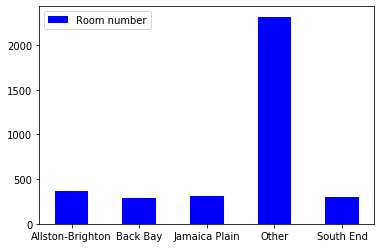

In [226]:
cities_to_highlight = ["Allston-Brighton","Jamaica Plain", "South End", "Back Bay"]
def coarse_location(city):
    if city in cities_to_highlight:
        return city
    else:
        return "Other"

boston_listings["coarse_location"] = boston_listings["neighbourhood"].apply(coarse_location)
boston_counts = boston_listings.groupby("coarse_location").size()

locs = np.arange(1, len(boston_counts)+1)

plt.bar(locs, boston_counts, width = 0.5, color="blue")

plt.legend(["Room number"])
plt.xticks(locs, boston_counts.index)

# Seattle

In [219]:
seattle_listings = pd.read_csv("seattle_listings_utf8.csv")
seattle_listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,2.016010e+13,2016/1/4,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,2.016010e+13,2016/1/4,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,2.016010e+13,2016/1/4,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,2.016010e+13,2016/1/4,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,2.016010e+13,2016/1/4,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [199]:
seattle_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 92 columns):
id                                  3818 non-null int64
listing_url                         3818 non-null object
scrape_id                           3818 non-null float64
last_scraped                        3818 non-null object
name                                3818 non-null object
summary                             3641 non-null object
space                               3249 non-null object
description                         3818 non-null object
experiences_offered                 3818 non-null object
neighborhood_overview               2786 non-null object
notes                               2212 non-null object
transit                             2884 non-null object
thumbnail_url                       3498 non-null object
medium_url                          3498 non-null object
picture_url                         3818 non-null object
xl_picture_url                      34

In [200]:
seattle_listings.isnull().sum()

id                                    0
listing_url                           0
scrape_id                             0
last_scraped                          0
name                                  0
                                   ... 
cancellation_policy                   0
require_guest_profile_picture         0
require_guest_phone_verification      0
calculated_host_listings_count        0
reviews_per_month                   627
Length: 92, dtype: int64

In [201]:
seattle_listings.duplicated().value_counts()

False    3818
dtype: int64

In [202]:
df_seattle_listings = seattle_listings.loc[:, ["id", "host_id", "latitude", "longitude", "price", "minimum_nights", "number_of_reviews", "reviews_per_month", "calculated_host_listings_count", "availability_365"]]
df_seattle_listings.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.818000e+03,3.818000e+03,3818.000000,3818.000000,3818.000000,3818.000000,3818.000000,3191.000000,3818.000000,3818.000000
mean,5.550111e+06,1.578556e+07,47.628961,-122.333103,127.976166,2.369303,22.223415,2.078919,2.946307,244.772656
std,2.962660e+06,1.458382e+07,0.043052,0.031745,90.250022,16.305902,37.730892,1.822348,5.893029,126.772526
min,3.335000e+03,4.193000e+03,47.505088,-122.417219,20.000000,1.000000,0.000000,0.020000,1.000000,0.000000
25%,3.258256e+06,3.275204e+06,47.609418,-122.354321,75.000000,1.000000,2.000000,0.695000,1.000000,124.000000
50%,6.118244e+06,1.055814e+07,47.623601,-122.328874,100.000000,2.000000,9.000000,1.540000,1.000000,308.000000
75%,8.035127e+06,2.590309e+07,47.662694,-122.310800,150.000000,2.000000,26.000000,3.000000,2.000000,360.000000
max,1.034016e+07,5.320861e+07,47.733358,-122.240607,1000.000000,1000.000000,474.000000,12.150000,37.000000,365.000000


## Exploration

### Geographical distribution

In [203]:
# autopct in pie
def geo_autopct(pct):
    return('%.2f' %pct) if pct > 2 else ''

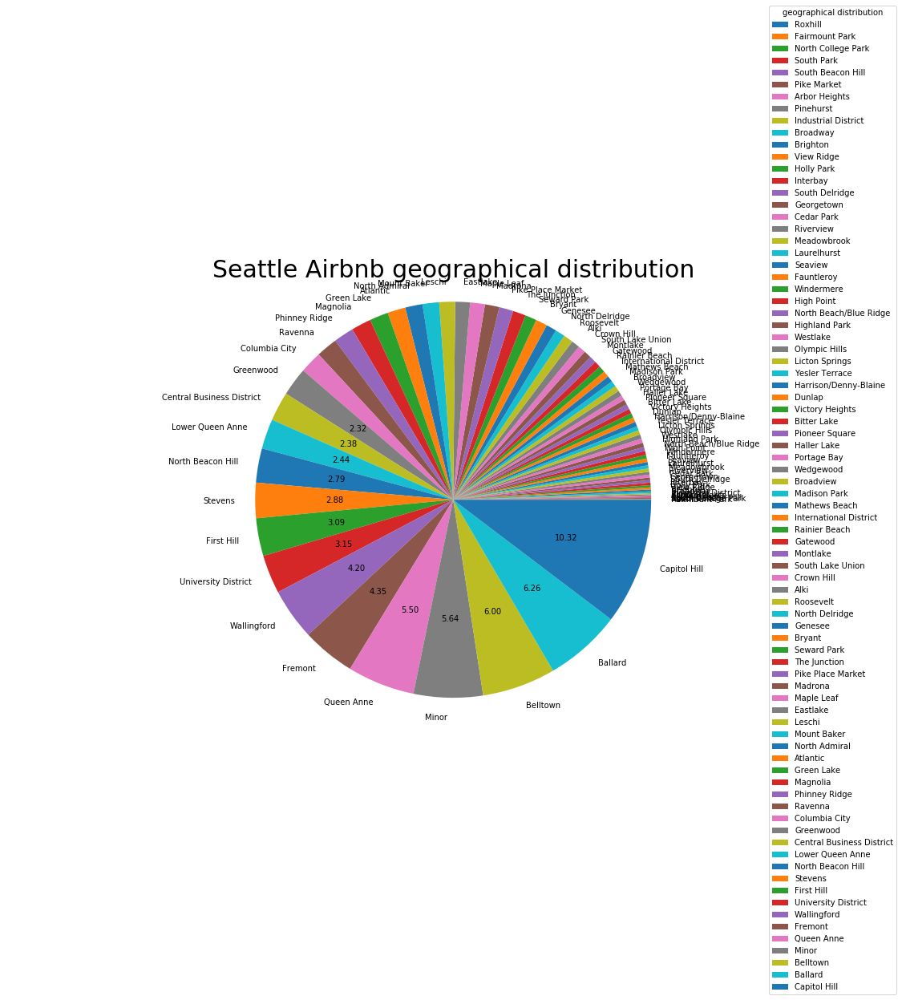

In [204]:
seattle_data_area=seattle_listings['neighbourhood'].value_counts(ascending=True)
plt.figure(figsize=(20,10))
plt.pie(seattle_data_area, labels=seattle_data_area.index, autopct=geo_autopct,shadow=False)  
plt.title("Seattle Airbnb geographical distribution",fontsize=30)
plt.axis('equal') 
plt.legend(title = "geographical distribution", loc = "center right") 

# only need top 30 areas, others save as others 
# How to delete label when value is less than 2% 

### Type distribution

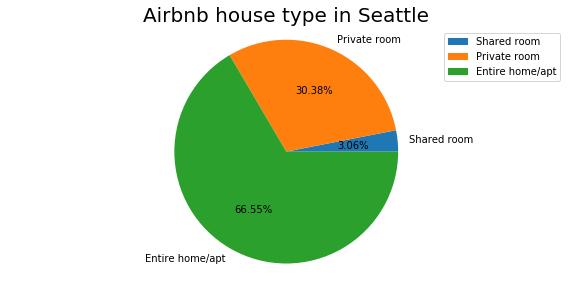

In [229]:
plt.figure(figsize=(10,10))

# Pie
Seattle_type= seattle_listings['room_type'].value_counts(ascending=True)
plt.subplot(211)
plt.pie(Seattle_type, labels=Seattle_type.index, autopct='%.2f%%',shadow=False)  
plt.title("Airbnb house type in Seattle",fontsize=20)
plt.axis('equal')
plt.legend() 

room_type,Entire home/apt,Private room,Shared room
neighbourhood,,,
Capitol Hill,245.0,84.0,22.0
Belltown,192.0,9.0,3.0
Queen Anne,143.0,43.0,1.0
Ballard,138.0,75.0,NaN
Minor,116.0,72.0,4.0
...,...,...,...
Georgetown,1.0,6.0,NaN
High Point,1.0,10.0,NaN
Holly Park,1.0,5.0,NaN


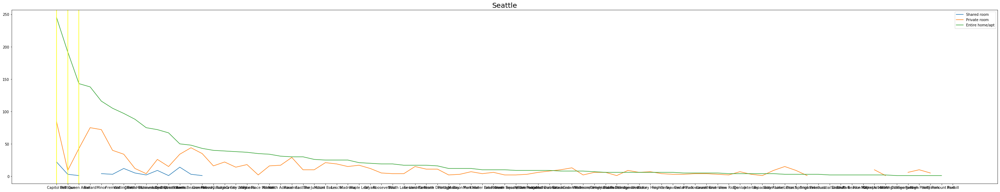

In [235]:
# line chart
plt.figure(figsize=(50,20))
Seattle_area_type = seattle_listings.groupby(['neighbourhood','room_type']).size().unstack()
Seattle_area_type = Seattle_area_type.sort_values(by='Entire home/apt',ascending=False) # sort with the value from the biggest
x= Seattle_area_type.index
plt.subplot(212)
plt.title("Seattle",fontsize=20)
plt.plot(x,Seattle_area_type['Shared room'],label = 'Shared room') 
plt.plot(x,Seattle_area_type['Private room'],label = 'Private room') 
plt.plot(x,Seattle_area_type['Entire home/apt'],label = 'Entire home/apt') 
plt.legend()  

# draw a verticle line to find certain data, Belltown, Ballard, Wallingford
ax = plt.gca()
ax.axvline("Belltown", color = "yellow")
ax.axvline("Capitol Hill", color = "yellow")
ax.axvline("Queen Anne", color = "yellow")

Seattle_area_type


### Price distribution

Text(0, 0.5, 'amount')

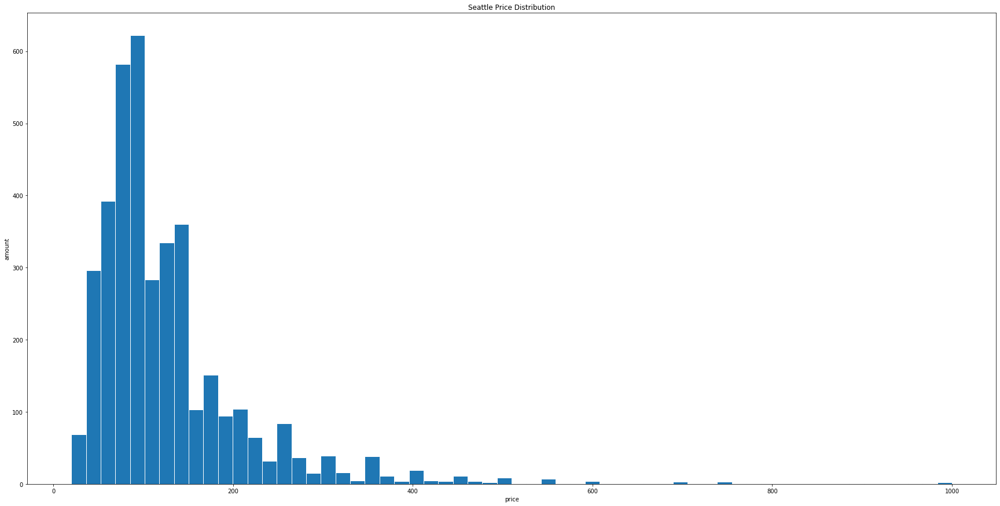

In [254]:
#Histogram
plt.figure(figsize=(30,15))
plt.hist(seattle_listings["price"], bins = 60 ,edgecolor='white',alpha=1)  
plt.title("Seattle Price Distribution")
plt.xlabel('price')
plt.ylabel('amount')


In [258]:
area_price_seattle = seattle_listings.groupby("neighbourhood",as_index=True).agg({'price':["mean","sum"]})
area_price_seattle.columns = area_price_seattle.columns.droplevel(0)
price_sort_seattle=area_price_seattle.sort_values(by=['sum'],ascending = False)
price_sort_seattle_mean=area_price_seattle.sort_values(by=['mean'],ascending = False)
price_sort_seattle
price_sort_seattle_mean

,mean,sum
neighbourhood,,
Fairmount Park,370.000000,370
Industrial District,245.000000,735
Portage Bay,241.428571,3380
Westlake,197.000000,2364
Alki,196.652174,4523
...,...,...
Georgetown,77.000000,539
Rainier Beach,76.722222,1381
Dunlap,75.461538,981


Text(0.5, 1.0, 'Average price by region')

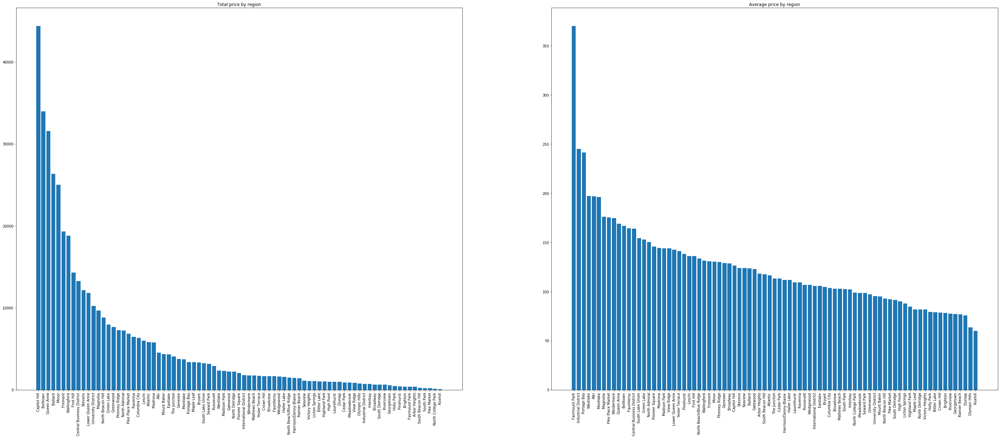

In [282]:
# Price in each area
plt.figure(figsize=(50,20))
# Total price by region
plt.subplot(121)
plt.bar(price_sort_seattle.index,price_sort_seattle['sum'])
plt.xticks(rotation=90)
plt.title('Total price by region')
# Average price by region
plt.subplot(122)
plt.bar(price_sort_seattle_mean.index,price_sort_seattle_mean['mean'])
plt.xticks(rotation=90)
plt.title('Average price by region')
# How to delete labels where value is less than 2?

### Host distribution

In [262]:
Seattle_room_num=seattle_listings.groupby('host_id',as_index=False)['id'].count().sort_values(by='id',ascending=False)
Seattle_room_num.rename(columns={"id": "room_num"},inplace=True)
Seattle_room_num.head()

,host_id,room_num
1045,8534462,46
730,4962900,39
278,1243056,37
131,430709,36
539,3074414,34


1.3878589603780442


(0, 100)

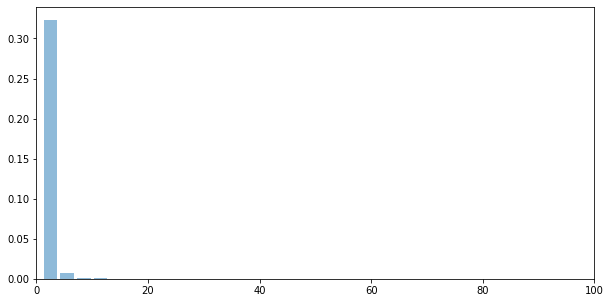

In [263]:
# average number of rooms
print(Seattle_room_num['room_num'].mean())

plt.figure(figsize=(10,5))
plt.hist(Seattle_room_num['room_num'],bins=15,density=1,alpha=0.5,rwidth=0.8)
plt.xlim(0,100) # range of x axis

In [264]:
Seattle_host_num=Seattle_room_num.groupby('room_num',as_index=False)['host_id'].count()
Seattle_host_num.rename(columns={"host_id": "host_num"},inplace=True)
Seattle_host_num=Seattle_host_num.sort_values(by='host_num',ascending=True)
Seattle_host_num.head()

,room_num,host_num
20,46,1
18,37,1
17,36,1
16,34,1
15,33,1


In [265]:
Seattle_host_num['room_num_all']=Seattle_host_num['room_num']*Seattle_host_num['host_num']
#The cumulative proportion of room
Seattle_host_num["room_percentage"] = Seattle_host_num["room_num_all"].cumsum()/Seattle_host_num["room_num_all"].sum()*100
#The cumulative proportion of host
Seattle_host_num["host_percentage"] = Seattle_host_num["host_num"].cumsum()/Seattle_host_num["host_num"].sum()*100
Seattle_host_num.head()

,room_num,host_num,room_num_all,room_percentage,host_percentage
20,46,1,46,1.204819,0.036350
18,37,1,37,2.173913,0.072701
17,36,1,36,3.116815,0.109051
16,34,1,34,4.007334,0.145402
15,33,1,33,4.871661,0.181752


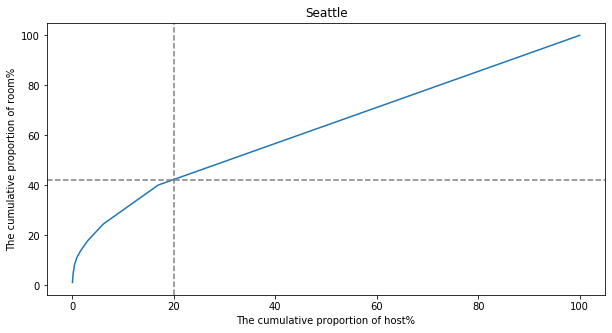

In [270]:
plt.figure(figsize=(10,5))
plt.plot(Seattle_host_num.host_percentage, Seattle_host_num.room_percentage)
# Gride & Guides
plt.title('Seattle')
plt.axhline(y=42,color='grey',linestyle='dashed')
plt.axvline(x=20,color='grey',linestyle='dashed')
plt.xlabel("The cumulative proportion of host%")
plt.ylabel("The cumulative proportion of room%")
plt.show()

#### Notes

> Hist comparison between hosts and rooms; geography scatter plot

### Geo Scatter

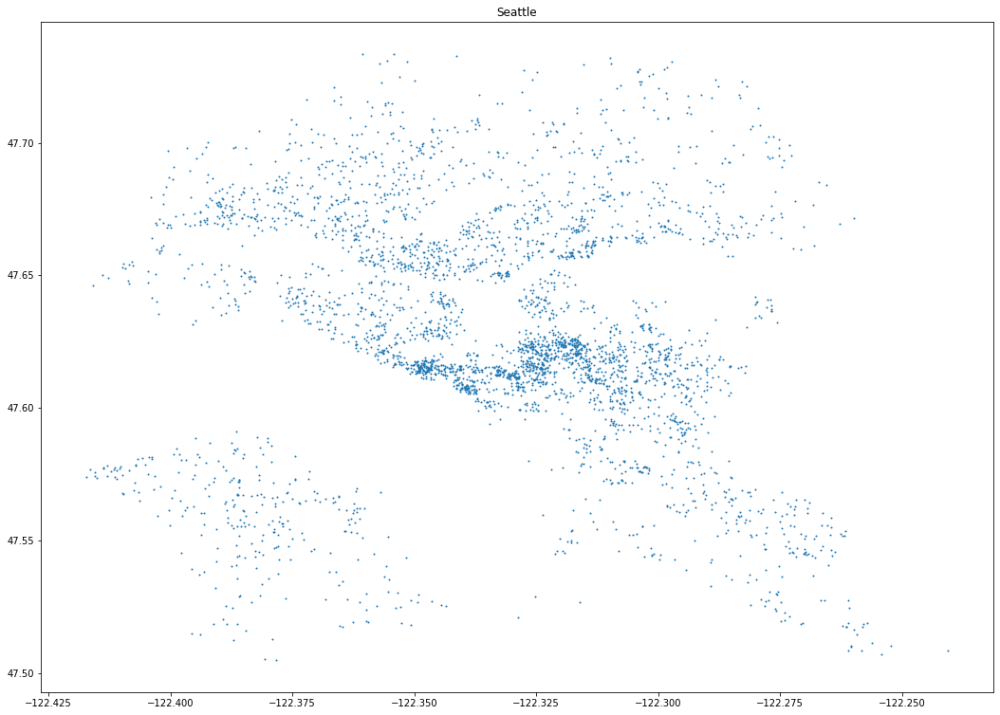

In [220]:
# The origional one
plt.figure(figsize=(18,13))
plt.title('Seattle')
plt.scatter(seattle_listings.longitude, seattle_listings.latitude, s=1)

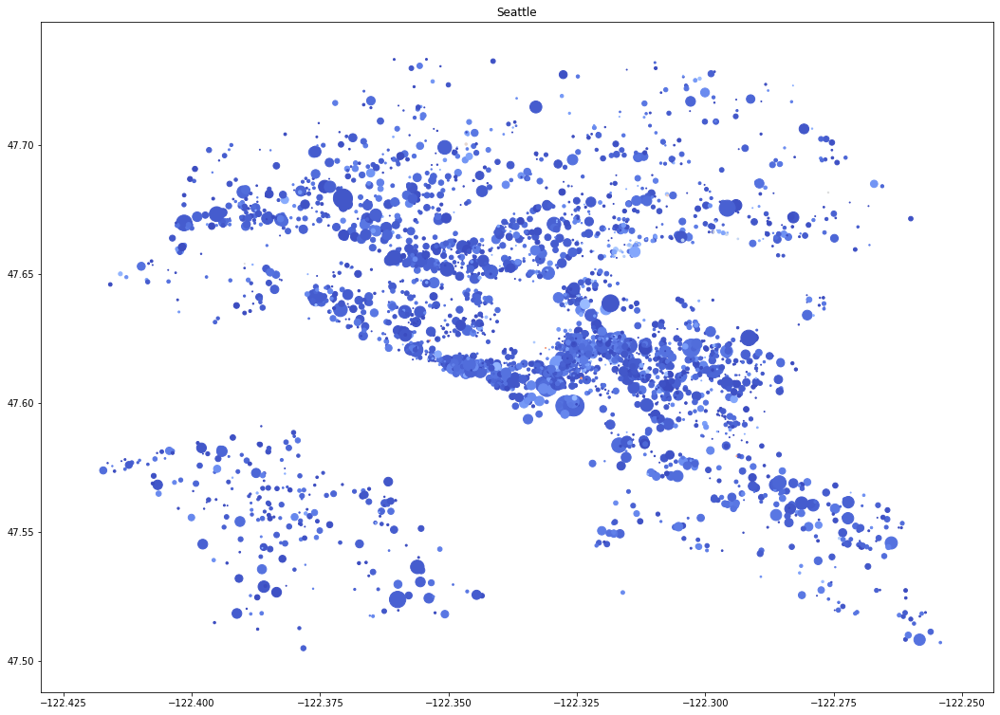

In [222]:
plt.figure(figsize=(18,13))
plt.title('Seattle')
size = seattle_listings.number_of_reviews
color = seattle_listings.review_scores_rating/100
plt.scatter(seattle_listings.longitude,  seattle_listings.latitude, 
            s=size, c=255*color, cmap="coolwarm_r")

### Where do houses come from?

In [227]:
Seattle_location_counts = seattle_listings.groupby("neighbourhood").size().sort_values(ascending=False)
Seattle_location_counts

neighbourhood
Capitol Hill          351
Ballard               213
Belltown              204
Minor                 192
Queen Anne            187
                     ... 
South Park              2
Pike Market             2
Fairmount Park          1
Roxhill                 1
North College Park      1
Length: 81, dtype: int64

([<matplotlib.axis.XTick at 0x1a308d98d0>,
 <a list of 5 Text xticklabel objects>)

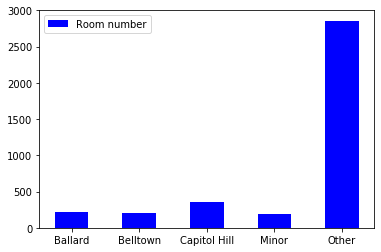

In [228]:
cities_to_highlight = ["Capitol Hill", "Ballard", "Belltown", "Minor"]
def coarse_location(city):
    if city in cities_to_highlight:
        return city
    else:
        return "Other"

seattle_listings["coarse_location"] = seattle_listings["neighbourhood"].apply(coarse_location)
seattle_counts = seattle_listings.groupby("coarse_location").size()

locs = np.arange(1, len(seattle_counts)+1)

plt.bar(locs, seattle_counts, width=0.5, color="blue")

plt.legend(["Room number"])
plt.xticks(locs, seattle_counts.index)

## Decision Tree attempt

### Boston

In [269]:
import pandas as pd
import random
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

In [197]:
col_names = ['neighbourhood', 'room_type', 'accommodates', 'price', 'label']
pima = pd.read_csv("boston_listings_new.csv", header=0, names=col_names)

In [103]:
pima.head()

,neighbourhood,room_type,accommodates,price,label
0,19,1,4,250,0
1,19,2,2,65,1
2,19,2,2,65,1
3,19,2,4,75,1
4,19,2,2,79,1


In [29]:
# replace room type with number flag
pima.replace({'Entire home/apt': 1,
             'Private room': 2,
            'Shared room':3
             },inplace=True) 

In [28]:
pima.replace({'Allston': 1,
             'Back Bay': 2,
            'Bay Village':3,
              'Beacon Hill':4,
              'Brighton':5,
              'Charlestown':6,
              'Chinatown':7,
              'Dorchester':8,
              'Downtown':9,
              'East Boston':10,
              'Fenway':11,
              'Hyde Park':12,
              'Jamaica Plain':13,
              'Leather District':14,
              'Longwood Medical Area':15,
              'Mattapan':16,
              'Mission Hill':17,
              'North End' :18,
              'Roslindale':19,
              'Roxbury':20,
              'South Boston':21,
              'South Boston Waterfront':22,
              'South End':23,
              'West End':24,
              'West Roxbury':25
             },inplace=True) 

In [95]:
pima

,neighbourhood,room_type,accommodates,price,label
0,19,1,4,250,0
1,19,2,2,65,1
2,19,2,2,65,1
3,19,2,4,75,1
4,19,2,2,79,1
...,...,...,...,...,...
3580,6,2,3,69,1
3581,1,2,2,150,0
3582,6,1,4,198,1
3583,6,2,2,65,0


In [77]:
with open("boston_listings_new.csv", "w") as out_file:
    output = pima.to_csv()
    out_file.write(output)

In [108]:
from random import seed
from random import randint
# seed random number generator
seed(10)
# generate some integers
pima['label'] = random.randint(0,1)

In [198]:
# split dataset in features and target variable

feature_cols = ['neighbourhood', 'room_type', 'accommodates']
X = pima[feature_cols] # Features
y = pima.label # Target variable

In [199]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [200]:
# building decsion tree
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [201]:
# Evaluating Model
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8838289962825279


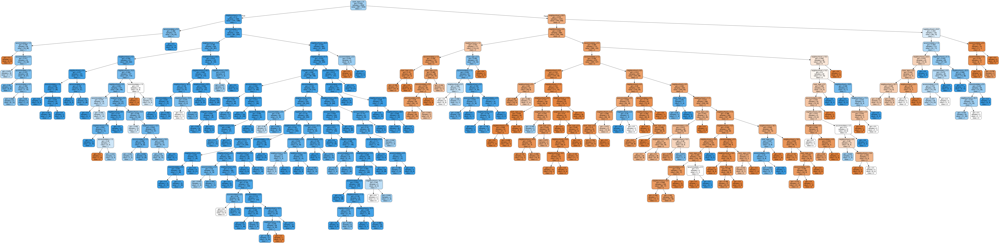

In [203]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Boston_origion.png')
Image(graph.create_png())

In [212]:
# Optimizing Decision Tree Performance
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=4)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.8782527881040892


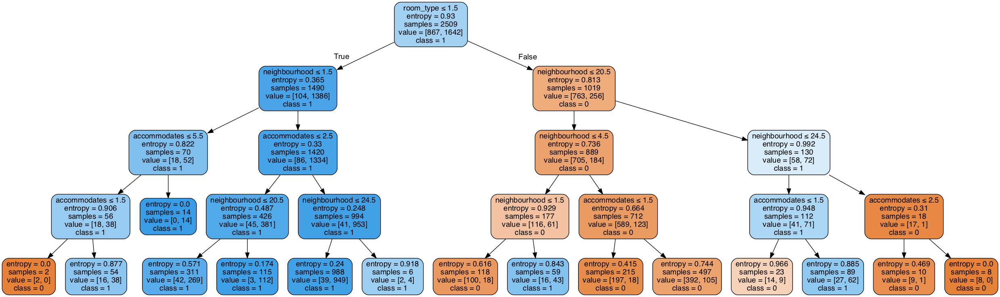

In [213]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Boston_new.png')
Image(graph.create_png())

### Seattle

In [184]:
col_names = ['neighbourhood', 'room_type', 'accommodates', 'price', 'label']
pima_S = pd.read_csv("Seattle_listings_new.csv", header=0, names=col_names)

In [185]:
pima_S.head()

,neighbourhood,room_type,accommodates,price,label
0,82,1,4,85,0
1,82,1,4,150,1
2,82,1,11,975,1
3,82,1,3,100,0
4,82,1,6,450,1


In [ ]:
# replace room type with number flag
pima_S.replace({'Entire home/apt': 1,
             'Private room': 2,
            'Shared room':3
             },inplace=True) 

In [105]:
pima_S.replace({'Adams': 1,
             'Alki': 2,
            'Arbor Heights':3,
              'Atlantic':4,
              'Belltown':5,
              'Bitter Lake':6,
              'Briarcliff':7,
              'Brighton':8,
              'Broadview':9,
              'Broadway':10,
              'Bryant':11,
              'Cedar Park':12,
              'Central Business District':13,
              'Columbia City':14,
              'Crown Hill':15,
              'Dunlap':16,
              'East Queen Anne':17,
              'Eastlake' :18,
              'Fairmount Park':19,
              'Fauntleroy':20,
              'First Hill':21,
              'Fremont':22,
              'Gatewood':23,
              'Genesee':24,
              'Georgetown':25,
                'Green Lake':26,
                'Greenwood':27,
                'Haller Lake':28,
                'Harrison/Denny-Blaine':29,
                'High Point':30,
                'Highland Park':31,
                'Holly Park':32,
                'Industrial District':33,
                'Interbay':34,
                'International District':35,
                'Laurelhurst':36,
                'Lawton Park':37,
                'Leschi':38,
                'Lower Queen Anne':39,
                'Loyal Heights':40,
                'Madison Park':41,
                'Madrona':42,
                'Mann':43,
                'Maple Leaf':44,
                'Matthews Beach':45,
                'Meadowbrook':46,
                'Mid-Beacon Hill':47,
                'Minor':48,
                'Montlake':49,
                'Mount Baker':50,
                'North Admiral':51,
                'North Beach/Blue Ridge':52,
                'North Beacon Hill':53,
                'North College Park':54,
                'North Delridge':55,
                'North Queen Anne':56,
                'Olympic Hills':57,
                'Phinney Ridge':58,
                'Pike-Market':59,
                'Pinehurst':60,
                'Pioneer Square':61,
                'Portage Bay':62,
                'Rainier Beach':63,
                'Ravenna':64,
                'Riverview':65,
                'Roosevelt':66,
                'Roxhill':67,
                'Seaview':68,
                'Seward Park':69,
                'South Beacon Hill':70,
                'South Delridge':71,
                'South Lake Union':72,
                'South Park':73,
                'Southeast Magnolia':74,
                'Stevens':75,
                'Sunset Hill':76,
                'University District':77,
                'Victory Heights':78,
                'View Ridge':79,
                'Wallingford':80,
                'Wedgwood':81,
                'West Queen Anne':82,
                'West Woodland':83,
                'Westlake':84,
                'Whittier Heights':85,
                'Windermere':86,
                'Yesler Terrace':87
             },inplace=True) 

In [167]:
pima_S

,neighbourhood,room_type,accommodates,label,price
0,82,1,4,85,0
1,82,1,4,150,1
2,82,1,11,975,1
3,82,1,3,100,1
4,82,1,6,450,1
...,...,...,...,...,...
3813,22,1,6,359,1
3814,62,1,4,79,1
3815,63,1,2,93,1
3816,41,1,2,99,0


In [107]:
with open("Seattle_listings_new.csv", "w") as out_file:
    output = pima_S.to_csv()
    out_file.write(output)

In [186]:
# split dataset in features and target variable

feature_cols = ['neighbourhood', 'room_type', 'accommodates']
X = pima_S[feature_cols] # Features
y = pima_S.label # Target variable

In [187]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [188]:
# building decsion tree
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [189]:
# Evaluating Model
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7818499127399651


In [190]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes_Seattle.png')
Image(graph.create_png())

In [195]:
# Optimizing Decision Tree Performance
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=5) # the biggest accuracy

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.7862129144851658


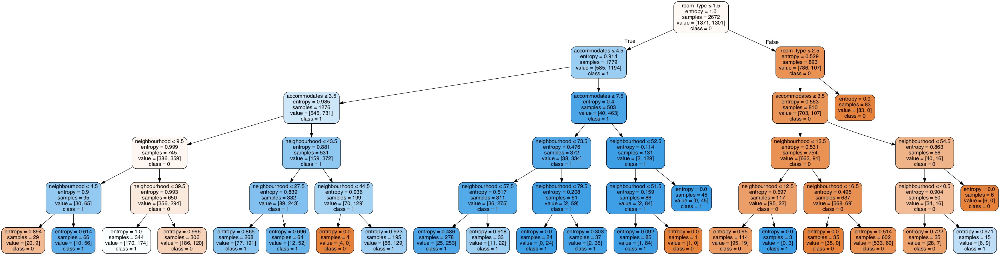

In [196]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('Seattle_new.png')
Image(graph.create_png())